<a href="https://colab.research.google.com/github/thoid/CFD-with-NN/blob/main/Research_Summer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import


In [ ]:
import numpy as np
import pandas as pd
import copy
from matplotlib import pyplot as plt
import tensorflow as tf

!pip install -q ipywidgets

In [ ]:
Reduction = False
Training = False
Hyperparameter = False

In [ ]:
dfs = []

for i in range(60):  # On lit de 0 à 8
    filename = f"data{i}.csv"
    df = pd.read_csv('Research_Project/Summer/Dataset/' + filename)
    dfs.append(df)

dfs[20]

,X[m],Y[m],Z[m],PMV
0,0.025,0.625,0.025,0.901
1,0.025,0.625,0.075,0.901
2,0.025,0.625,0.125,0.902
3,0.025,0.625,0.175,0.877
4,0.025,0.625,0.225,0.836
...,...,...,...,...
83179,4.975,1.975,0.975,0.780
83180,4.975,1.975,1.025,0.780
83181,4.975,1.975,1.075,0.782
83182,4.975,1.975,1.125,0.788


In [ ]:
if not Reduction :
  dfs_rd = []
  for i in range(60):  # On lit de 0 à 8
    filename = f"data_reduced{i}.csv"
    df = pd.read_csv('Research_Project/Summer/Dataset_rd/' + filename)
    dfs_rd.append(df)

# Sol Air Temperature

## Sol Air Temperature Calculation

In [ ]:
A_window = 1.8*2
A_wall =  2.5*2-1.8*2

U_window_summer = 4.28
U_wall_summer = 3.25

U_window_winter = 4.45
U_wall_winter = 3.41

In [ ]:
temp = pd.read_excel('Research_Project/SAT/temp.xlsx')
temp = pd.melt(temp, id_vars=['Jour'], var_name='Heure', value_name='Outdoor Air Temperature')
temp= temp.sort_values(by=['Jour', 'Heure'])

temp

,Jour,Heure,Outdoor Air Temperature
0,1,1,1.3
365,1,2,0.4
730,1,3,0.5
1095,1,4,0.8
1460,1,5,0.3
...,...,...,...
7299,365,20,1.8
7664,365,21,1.1
8029,365,22,1.3
8394,365,23,0.9


In [ ]:
atmo = pd.read_excel('Research_Project/SAT/atmo.xlsx')
atmo = pd.melt(atmo, id_vars=['Jour'], var_name='Heure', value_name='Atmospheric Radiation')
atmo= atmo.sort_values(by=['Jour', 'Heure'])

atmo

,Jour,Heure,Atmospheric Radiation
0,1,1,0.99
365,1,2,0.98
730,1,3,0.98
1095,1,4,0.99
1460,1,5,0.99
...,...,...,...
7299,365,20,1.03
7664,365,21,1.01
8029,365,22,1.00
8394,365,23,0.99


In [ ]:
df_calcul = pd.merge(temp, atmo, on=['Jour', 'Heure'])

df_calcul['Atmospheric Radiation'] = df_calcul['Atmospheric Radiation'].apply(lambda x: x * (10**6/3600))
df_calcul['Ground Surface Longwave Radiation'] = 5.67 * 10**-8 * (df_calcul['Outdoor Air Temperature'] + 273)**4
df_calcul['Effective Longwave Radiation'] =df_calcul['Ground Surface Longwave Radiation'] - df_calcul['Atmospheric Radiation']
df_calcul['Vertical Effective Longwave Radiation'] = 0.5 * df_calcul['Effective Longwave Radiation']
df_calcul['Sol Air Temperature'] = df_calcul['Outdoor Air Temperature'] - 0.77/22.7 * df_calcul['Vertical Effective Longwave Radiation']
df_calcul


,Jour,Heure,Outdoor Air Temperature,Atmospheric Radiation,Ground Surface Longwave Radiation,Effective Longwave Radiation,Vertical Effective Longwave Radiation,Sol Air Temperature
0,1,1,1.3,275.000000,320.986147,45.986147,22.993073,0.520059
1,1,2,0.4,272.222222,316.794111,44.571889,22.285944,-0.355955
2,1,3,0.5,272.222222,317.257854,45.035631,22.517816,-0.263820
3,1,4,0.8,275.000000,318.652136,43.652136,21.826068,0.059644
4,1,5,0.3,275.000000,316.330877,41.330877,20.665439,-0.400986
...,...,...,...,...,...,...,...,...
8755,365,20,1.8,286.111111,323.332956,37.221845,18.610922,1.168704
8756,365,21,1.1,280.555556,320.051009,39.495454,19.747727,0.430143
8757,365,22,1.3,277.777778,320.986147,43.208369,21.604184,0.567171
8758,365,23,0.9,275.000000,319.117917,44.117917,22.058958,0.151745


## Summer Temperature

In [ ]:
df_summer = df_calcul[(df_calcul['Outdoor Air Temperature'] > 27) & (df_calcul['Heure'] > 17)]

df_summer

,Jour,Heure,Outdoor Air Temperature,Atmospheric Radiation,Ground Surface Longwave Radiation,Effective Longwave Radiation,Vertical Effective Longwave Radiation,Sol Air Temperature
4702,196,23,27.3,430.555556,461.109837,30.554282,15.277141,26.781789
4745,198,18,30.7,427.777778,482.349937,54.572160,27.286080,29.774437
4746,198,19,29.9,422.222222,477.287601,55.065379,27.532689,28.966072
4747,198,20,29.3,419.444444,473.517079,54.072634,27.036317,28.382909
4748,198,21,28.5,416.666667,468.524520,51.857854,25.928927,27.620473
4749,198,22,27.2,413.888889,460.495945,46.607056,23.303528,26.409528
4769,199,18,30.8,455.555556,482.985549,27.429994,13.714997,30.334778
4770,199,19,27.7,433.333333,463.571546,30.238213,15.119106,27.187149
4771,199,20,28.0,433.333333,465.424286,32.090953,16.045476,27.455726
4772,199,21,27.6,430.555556,462.955197,32.399642,16.199821,27.050491


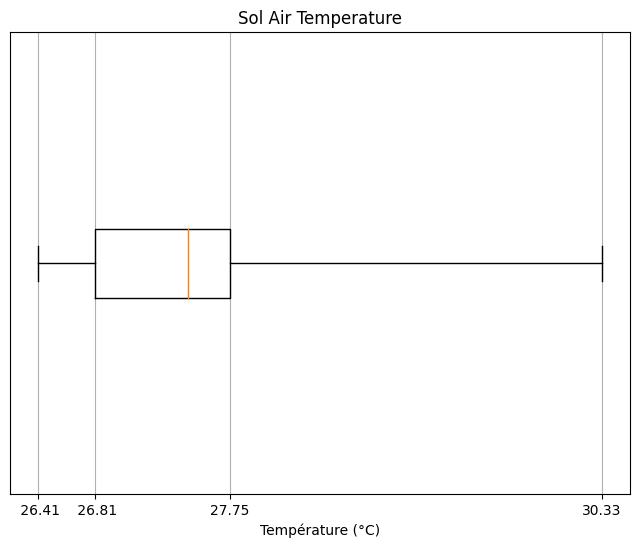

In [ ]:
q1 = df_summer['Sol Air Temperature'].quantile(0.25)
q3 = df_summer['Sol Air Temperature'].quantile(0.75)
min = df_summer['Sol Air Temperature'].min()
max = df_summer['Sol Air Temperature'].max()


# Créer le boxplot
plt.figure(figsize=(8, 6))
plt.boxplot(df_summer['Sol Air Temperature'], vert=False, whis = [0,100])
plt.title('Sol Air Temperature')
plt.xlabel('Température (°C)')
plt.yticks([])
plt.grid(True)

# Ajouter les marqueurs pour les valeurs caractéristiques
plt.xticks([min,q1, q3,max], [' {:.2f}'.format(min),' {:.2f}'.format(q1), '{:.2f}'.format(q3),'{:.2f}'.format(max)])

plt.show()

In [ ]:
T_min_ref_summer = 25
T_2_summer = 26
T_3_summer = 26.5
T_max_ref_summer = 27.5


Q_max_1 = (A_window * U_window_summer + A_wall * U_wall_summer) * (min - T_min_ref_summer)
Q_min_1 = (A_window * U_window_summer + A_wall * U_wall_summer) * (min - T_max_ref_summer)
Q_3_1 = (A_window * U_window_summer + A_wall * U_wall_summer) * (min - T_2_summer)
Q_2_1 = (A_window * U_window_summer + A_wall * U_wall_summer) * (min - T_3_summer)

Q_max_2 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q1 - T_min_ref_summer)
Q_min_2 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q1 - T_max_ref_summer)
Q_3_2 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q1 - T_2_summer)
Q_2_2 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q1 - T_3_summer)

Q_max_3 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q3 - T_min_ref_summer)
Q_min_3 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q3 - T_max_ref_summer)
Q_3_3 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q3 - T_2_summer)
Q_2_3 = (A_window * U_window_summer + A_wall * U_wall_summer) * (q3 - T_3_summer)

Q_max_4 = (A_window * U_window_summer + A_wall * U_wall_summer) * (max - T_min_ref_summer)
Q_min_4 = (A_window * U_window_summer + A_wall * U_wall_summer) * (max - T_max_ref_summer)
Q_3_4 = (A_window * U_window_summer + A_wall * U_wall_summer) * (max - T_2_summer)
Q_2_4 = (A_window * U_window_summer + A_wall * U_wall_summer) * (max - T_3_summer)



power_table = pd.DataFrame({
    'SAT': [min, q1, q3, max],
    'Qmin': [0, Q_min_2, Q_min_3, Q_min_4],
    'Q2': [Q_2_1, Q_2_2, Q_2_3, Q_2_4],
    'Q3': [Q_3_1, Q_3_2, Q_3_3, Q_3_4],
    'Qmax': [Q_max_1, Q_max_2, Q_max_3, Q_max_4]
})


power_table = pd.DataFrame(np.where(power_table < 0, 0, power_table), columns=power_table.columns)
power_table

,SAT,Qmin,Q2,Q3,Qmax
0,26.409528,0.000000,0.000000,8.173358,28.131358
1,26.807652,0.000000,6.140124,16.119124,36.077124
2,27.745379,4.897275,24.855275,34.834275,54.792275
3,30.334778,56.576492,76.534492,86.513492,106.471492


# Data Splitting

In [ ]:
index_train = [0,2,3,5,6,7,8,10,11,12,13,15,16,18,19,21,22,24,25,27,28,29,30,32,34,35,36,37,38,39,41,43,44,46,47,48,49,50,53,54,55,56,57,59]
index_test = [1,9,14,17,20,26,33,40,42,45,51,52]
index_val=[4,23,31,58]

Name_train = ['0','2','3','5','6','7','8','10','11','12','13','15','16','18','19','21','22','24','25','27','28','29','30','32','34','35','36','37','38','39','41','43','44','46','47','48','49','50','53','54','55','56','57','59']
Name_test = ['1','9','14','17','20','26','33','40','42','45','51','52']
Name_val=['4','23','31','58']


y_train = np.array([dfs[i].loc[:, 'PMV'] for i in index_train])
y_test = np.array([dfs[i].loc[:, 'PMV'] for i in index_test])


y_val = np.array([dfs[i].loc[:, 'PMV'] for i in index_val])


X_tot = np.array([
    [1,26.41,0.10], [1,26.41,8.17],[1,26.41,28.13],
    [1,26.81,0.10], [1,26.81,6.14], [1,26.81,16.12], [1,26.81,36.08],
    [1,27.75,4.90], [1,27.75,24.86], [1,27.75,34.83], [1,27.75,54.79],
    [1,30.33,56.58], [1,30.33,76.53], [1,30.33,86.51], [1,30.33,106.47],

    [2,26.41,0.10], [2,26.41,8.17],[2,26.41,28.13],
    [2,26.81,0.10], [2,26.81,6.14], [2,26.81,16.12], [2,26.81,36.08],
    [2,27.75,4.90], [2,27.75,24.86], [2,27.75,34.83], [2,27.75,54.79],
    [2,30.33,56.58], [2,30.33,76.53], [2,30.33,86.51], [2,30.33,106.47],

    [3,26.41,0.10], [3,26.41,8.17],[3,26.41,28.13],
    [3,26.81,0.10], [3,26.81,6.14], [3,26.81,16.12], [3,26.81,36.08],
    [3,27.75,4.90], [3,27.75,24.86], [3,27.75,34.83], [3,27.75,54.79],
    [2,30.33,56.58], [3,30.33,76.53], [3,30.33,86.51], [3,30.33,106.47],

    [4,26.41,0.10], [4,26.41,8.17],[4,26.41,28.13],
    [4,26.81,0.10], [4,26.81,6.14], [4,26.81,16.12], [4,26.81,36.08],
    [4,27.75,4.90], [4,27.75,24.86], [4,27.75,34.83], [4,27.75,54.79],
    [4,30.33,56.58], [4,30.33,76.53], [4,30.33,86.51], [4,30.33,106.47]
    ])

X_train = np.array([X_tot[i] for i in index_train])
X_test = np.array([X_tot[i] for i in index_test])
X_val = np.array([X_tot[i] for i in index_val])

In [ ]:
print(np.max(y_train))
print(np.min(y_train))
print(np.max(y_test))
print(np.min(y_test))
print(np.max(y_val))
print(np.min(y_val))

1.09
-1.4
1.13
-1.38
0.98
-0.643


In [ ]:
def data_base(dataset):
  colonne_X = np.round(dataset['X[m]'],3)
  colonne_Y = np.round(dataset['Y[m]'],3)
  colonne_Z = np.round(dataset['Z[m]'],3)

  return pd.DataFrame({'X[m]': colonne_X, 'Y[m]': colonne_Y, 'Z[m]': colonne_Z})

df_base = data_base(dfs[0])
df_base_rd = data_base(dfs_rd[0])

# Plots

## Plot Functions

In [ ]:
def plot(pmv_values,df_base, figure_names,z_val = 1.025):

  num_plots = len(pmv_values)
  num_cols = 2

  if num_plots % 3 == 0:
    num_cols = 3

  num_rows = (num_plots + num_cols - 1) // num_cols

  fig, ax_main = plt.subplots(num_rows, num_cols, figsize=(20, 12))
  for i, (data, name) in enumerate(zip(pmv_values, figure_names)):

    df_b = df_base.copy()
    df_b['PMV'] = pmv_values[i]
    df_z = df_b[df_b['Z[m]'] == z_val]
    row_idx = i // num_cols
    col_idx = i % num_cols

    # Récupérer les valeurs de X, Y et PMV
    X = df_z['X[m]']
    Y = df_z['Y[m]']
    PMV = df_z['PMV']

    # Taille des marqueurs en fonction de la densité de la grille
    marker_size = 100

    # Tracer le graphique 2D
    im = ax_main[row_idx, col_idx].scatter(X, Y, c=PMV, vmin= -1.38, vmax= 0.98, cmap='jet', marker='s')
    ax_main[row_idx, col_idx].set_xlabel('X (m)')
    ax_main[row_idx, col_idx].set_ylabel('Y (m)')
    ax_main[row_idx, col_idx].set_xlim(0, 5)
    ax_main[row_idx, col_idx].set_ylim(0, 2)
    ax_main[row_idx, col_idx].set_title("Data Number : {}".format(name))

  cbar_ax = fig.add_axes([1.1, 0.25, 0.02, 0.5])  # [left, bottom, width, height]
  cbar = fig.colorbar(im, cax=cbar_ax, orientation='vertical')
  cbar.set_label("PMV")

  plt.tight_layout()
  plt.show()


In [ ]:
import plotly.graph_objects as go
import pandas as pd
import ipywidgets as widgets
from IPython.display import display, clear_output

def interactiv_3D_plot(df1,df2,title):

  min_color_value = np.min([df1['PMV'].min(), df2['PMV'].min()])
  max_color_value = np.max([df1['PMV'].max(), df2['PMV'].max()])

  x_range = [0, 5]
  y_range = [0, 2]
  z_range = [0, 1.2]

  aspect_ratio = dict(x=2.5, y=1, z=0.6)

  fig = go.Figure()

  # Add first subplot
  fig.add_trace(go.Scatter3d(
      x=df1['X[m]'],
      y=df1['Y[m]'],
      z=df1['Z[m]'],
      mode='markers',
      marker=dict(
          size=5,
          color=df1['PMV'],                # set color to the PMV values
          colorscale='Jet',
          cmin = min_color_value,
          cmax = max_color_value,
          colorbar=dict(title='PMV'),
          opacity=0.8
      ),
      scene="scene1"
  ))

  # Add second subplot
  fig.add_trace(go.Scatter3d(
      x=df2['X[m]'],
      y=df2['Y[m]'],
      z=df2['Z[m]'],
      mode='markers',
      marker=dict(
          size=5,
          color=df2['PMV'],                # set color to the PMV values
          colorscale='Jet',
          cmin = min_color_value,
          cmax = max_color_value,
          opacity=0.8
      ),
      scene="scene2",
      name = 'test'
  ))

  # Update layout for subplot 1
  fig.update_layout(
      height=800,
      scene=dict(
          camera=dict(
              up=dict(x=0, y=0, z=1),
              center=dict(x=0, y=0, z=0),
              eye=dict(x=-2, y=-2, z=1.25)),
          xaxis_title='X',
          yaxis_title='Y',
          zaxis_title='Z',
          xaxis=dict(range=x_range),
          yaxis=dict(range=y_range),
          zaxis=dict(range=z_range),
          aspectratio=aspect_ratio,
          domain=dict(x=[0, 0.45])
      ),
      scene2=dict(
          camera=dict(
              up=dict(x=0, y=0, z=1),
              center=dict(x=0, y=0, z=0),
              eye=dict(x=-2, y=-2, z=1.25)),
          xaxis_title='X',
          yaxis_title='Y',
          zaxis_title='Z',
          xaxis=dict(range=x_range),
          yaxis=dict(range=y_range),
          zaxis=dict(range=z_range),
          aspectratio=aspect_ratio,
          domain=dict(x=[0.55, 1])
      ),

    annotations=[
        dict(
            text=title[0],
            x=0.150,
            y=1.05,
            showarrow=False,
            font=dict(size=20)
        ),
        dict(
            text=title[1],
            x=0.850,
            y=1.05,
            showarrow=False,
            font=dict(size=20)
        )
    ]
  )

  fig.show()

  def plot_3D(df1,df2, z=-1, y=-1, x=-1):
    if z > 0:
        df_1 = df1[df1['Z[m]'] == z]
        df_2 = df2[df2['Z[m]'] == z]
    elif y > 0:
        df_1 = df1[df1['Y[m]'] == y]
        df_2 = df2[df2['Y[m]'] == y]
    elif x > 0:
        df_1 = df1[df1['X[m]'] == x]
        df_2 = df2[df2['X[m]'] == x]
    else:
        df_1 = df1
        df_2 = df2

    fig.data[0].x = df_1['X[m]']
    fig.data[0].y = df_1['Y[m]']
    fig.data[0].z = df_1['Z[m]']
    fig.data[0].marker['color'] = df_1['PMV']

    fig.data[1].x = df_2['X[m]']
    fig.data[1].y = df_2['Y[m]']
    fig.data[1].z = df_2['Z[m]']
    fig.data[1].marker['color'] = df_2['PMV']

    fig.show()


  x_slider = widgets.FloatSlider(min=0.025, max=4.975, step=0.05, description='X:')
  y_slider = widgets.FloatSlider(min=0.025, max=1.975, step=0.05, description='Y:')
  z_slider = widgets.FloatSlider(min=0.025, max=1.175, step=0.05, description='Z:')


  def update_plot(change, curseur):

    clear_output(wait=True)

    if curseur == 'x':
        plot_3D(df1,df2, x=change.new)
    elif curseur == 'y':
        plot_3D(df1,df2, y=change.new)
    elif curseur == 'z':
        plot_3D(df1,df2, z=change.new)

    spacer_left = widgets.Label(layout=widgets.Layout(flex='1 1 auto'))
    spacer_right = widgets.Label(layout=widgets.Layout(flex='1 1 auto'))
    grid = widgets.GridspecLayout(3, 3)
    grid[0, 1] = x_slider
    grid[1, 1] = y_slider
    grid[2, 1] = z_slider
    grid[1, 0] = spacer_left
    grid[1, 2] = spacer_right

    display(grid)

  # Associer la fonction de rappel à l'événement de changement de valeur du curseur
  x_slider.observe(lambda change: update_plot(change, 'x'), 'value')
  y_slider.observe(lambda change: update_plot(change, 'y'), 'value')
  z_slider.observe(lambda change: update_plot(change, 'z'), 'value')

  # Création de la grille pour placer les curseurs
  spacer_left = widgets.Label(layout=widgets.Layout(flex='1 1 auto'))
  spacer_right = widgets.Label(layout=widgets.Layout(flex='1 1 auto'))
  grid = widgets.GridspecLayout(3, 3)
  grid[0, 1] = x_slider
  grid[1, 1] = y_slider
  grid[2, 1] = z_slider
  grid[1, 0] = spacer_left
  grid[1, 2] = spacer_right

  # Affichage initial de la grille et du graphique
  display(grid)

## Plot at Z = 1m

<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



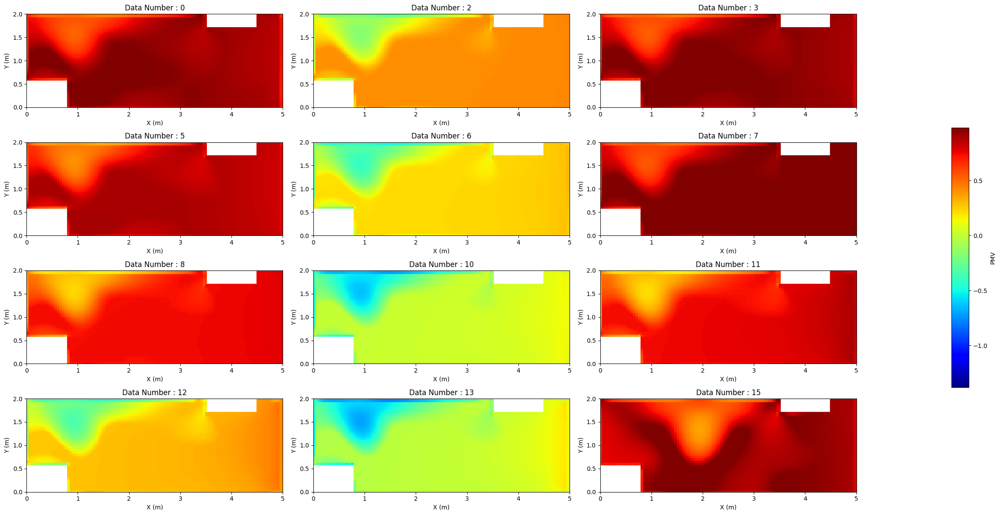

In [ ]:
plot(y_train[0:12],df_base,Name_train,0.975)

<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



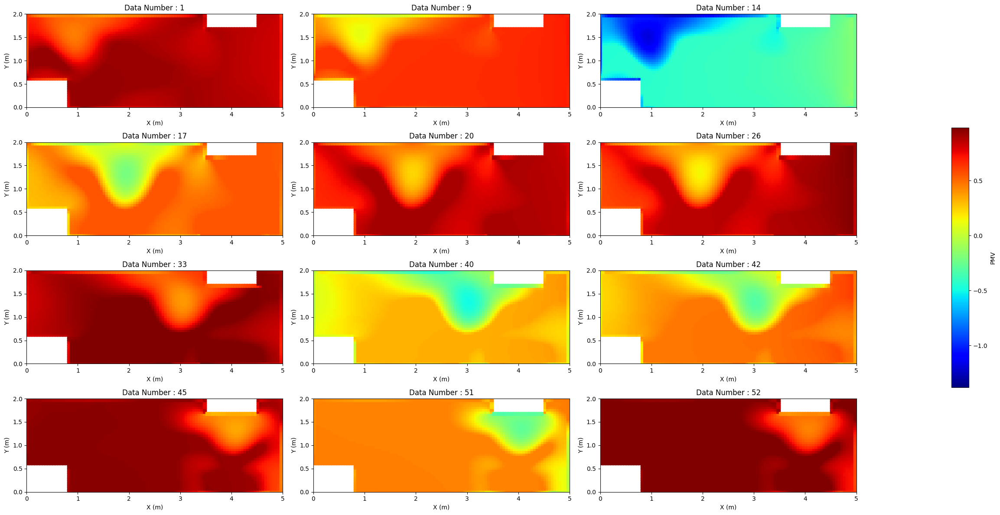

In [ ]:
plot(y_test,df_base,Name_test,0.975)

## Interactive Plot

In [ ]:
#13,28,43,58
interactiv_3D_plot(dfs[13], dfs[58],['Yac = 1m','Yac = 4m'])

GridspecLayout(children=(FloatSlider(value=0.025, description='X:', layout=Layout(grid_area='widget001'), max=…

# Hyperparameters Optimization

In [ ]:
!pip3 install mlflow dagshub --quiet

import dagshub
import mlflow

dagshub.init("Research", "thoid", mlflow=True)

Initialized MLflow to track repo "thoid/Research"

Repository thoid/Research initialized!

In [ ]:
!pip install hyperopt --quiet

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials, space_eval

In [ ]:
def best_model(X_train, y_train, X_val, y_val, output_neurons, params):

    if params['optimizers'] == 'Adam':
        opti = tf.keras.optimizers.Adam(learning_rate= params['learning_rate'])
    elif params['optimizers'] == 'RMSprop':
        opti = tf.keras.optimizers.RMSprop(learning_rate= params['learning_rate'])
    elif params['optimizers'] == 'SGD':
        opti = tf.keras.optimizers.SGD(learning_rate= params['learning_rate'])

    neurons = params['neurons']
    nb_hidden = params['nb_hidden']  # Nombre de couches cachées

    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.Dense(5, input_shape=(3,)))  # Couche d'entrée

    # Ajouter les couches cachées
    for _ in range(nb_hidden):
        model.add(tf.keras.layers.Dense(neurons, activation=params['activation']))

    model.add(tf.keras.layers.Dense(output_neurons))  # Couche de sortie

    model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer=opti)

    history = model.fit(X_train, y_train, epochs=params['epochs'], batch_size=1, verbose=0,
                        validation_data=(X_val, y_val))

    return model, history


In [ ]:
space = {
    'neurons': hp.choice('neurons', [16, 32, 64, 128]),
    'optimizers': hp.choice('optimizers', ['Adam','RMSprop','SGD']),
    'nb_hidden': hp.choice('nb_hidden', [5, 10, 20]),
    'epochs' : hp.choice('epochs', [500]),
    'learning_rate' : hp.uniform("learnin_rate",0.001,0.01),
    'activation' : hp.choice('activation', ['relu', 'sigmoid','tanh'])
}

In [ ]:
def objective(params):
    model, history = best_model(X_train, y_train, X_val, y_val, 83184, params)
    # Calculer une métrique pour l'optimisation, par exemple, l'accuracy
    loss = history.history['val_loss'][-1]  # Vous pouvez utiliser d'autres métriques pertinentes
    return {'loss': loss, 'status': STATUS_OK, 'model': model, 'params': params}

In [ ]:
if Hyperparameter:
  trials = Trials()
  best_params = fmin(objective, space, algo=tpe.suggest, max_evals=200, trials=trials)
  space_eval(space, best_params)

In [ ]:
if Hyperparameter:

  for trial in trials.trials:
    # Extraire les paramètres et les résultats de l'essai
    params = trial['result']['params']
    loss = trial['result']['loss']
    model = trial['result']['model']  # Récupérer le modèle entraîné

    # Enregistrer les paramètres et les résultats de l'essai dans MLflow
    with mlflow.start_run():
        mlflow.log_params(params)
        mlflow.log_metric('val_loss', loss)

# Neural Network : Basic Case

## Model Definition and Training

In [ ]:
import time
def create_model(neurons,optimizer, loss, output_neurons):

  model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(5 , input_shape=(3,)), # input layer
    tf.keras.layers.Dense(neurons, activation='relu'), # 1st hiddden layer
    tf.keras.layers.Dense(neurons, activation='relu'),
    tf.keras.layers.Dense(neurons, activation='relu'),
    tf.keras.layers.Dense(neurons, activation='relu'),
    tf.keras.layers.Dense(neurons, activation='relu'),
    tf.keras.layers.Dense(output_neurons) # output layer
  ])
  model.compile(loss = loss, optimizer = optimizer)

  return model

In [ ]:
import pickle
def train_model(X_train, y_train, X_val, y_val, output_neurons):
    model = create_model(64, tf.keras.optimizers.RMSprop(), tf.keras.losses.MeanSquaredError(), output_neurons)

    starting_time = time.time()

    history = model.fit(X_train, y_train, epochs=5000, batch_size=1, verbose=2,
                        validation_data=(X_val, y_val))

    training_time = time.time() - starting_time
    print("Training time:", training_time)
    return model, history

if Training:
  model, history = train_model(X_train, y_train,X_val,y_val,83184)
  model.save('Research_Project/Summer/Model/model_summer.h5')
  with open('Research_Project/Summer/History/history_summer.pkl', 'wb') as f:
    pickle.dump(history, f)

In [ ]:
from keras.models import load_model

if not Training:

  model = load_model('Research_Project/Summer/Model/model_summer.h5')
  with open('Research_Project/Summer/History/history_summer.pkl', 'rb') as f:
    history = pickle.load(f)

## Training and Validation Loss

In [ ]:
def training_loss(history):
  loss = history.history['loss']
  val_loss = history.history['val_loss']

  # Nombre d'époques
  epochs = range(1, len(loss) + 1)

  # Tracé des courbes de perte
  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title('Training and Validation loss')
  plt.ylim(0,0.1)
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

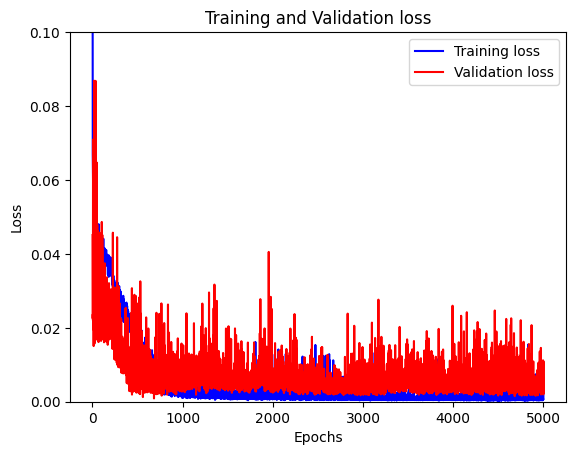

In [ ]:
training_loss(history)

## Error Function

To evaluate the difference between CFD simulation and NN results :

$Error[i][j] = \left| \frac{{y_{NN}[i][j] - y_{CFD}[i][j]}}{{\max(y_{CFD}[i]) - \min(y_{CFD}[i])}} \right| \times 100
 $

In [ ]:
def Erreur_relative(y_CFD, y_NN, err=50):
    y_CFD_max_min = np.ptp(y_CFD, axis=1)  # Calcul de la plage (max - min) de chaque ligne de y_CFD
    Erreur_relative = np.abs((y_NN - y_CFD) / y_CFD_max_min[:, np.newaxis]) * 100
    return Erreur_relative

## Results Analysis

### Test on Training Dataset

In [ ]:
y_train_result = model.predict(X_train)

2/2 [==============================] - 0s 4ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



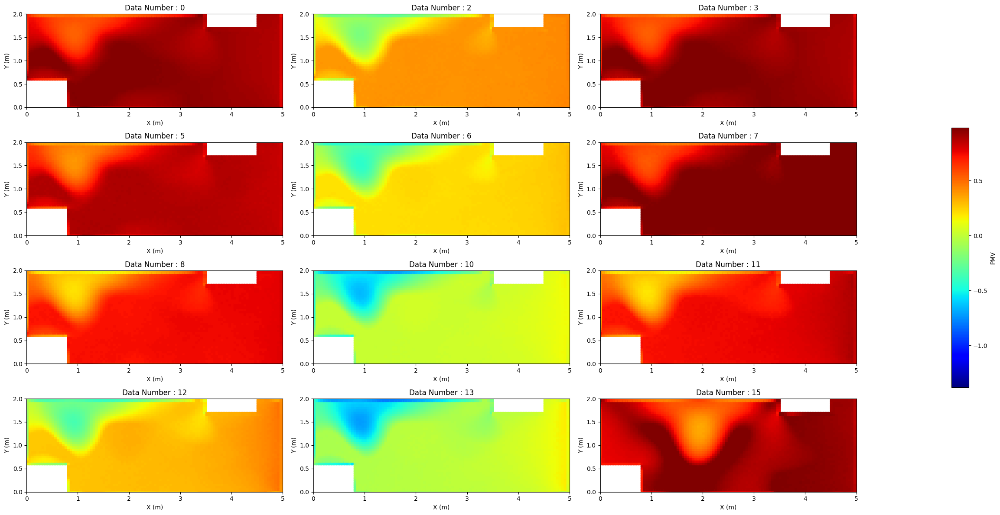

In [ ]:
plot(y_train_result[0:12],df_base,Name_train,0.975)

### Test on Testing Dataset

In [ ]:
y_test_result = model.predict(X_test)

1/1 [==============================] - 0s 17ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



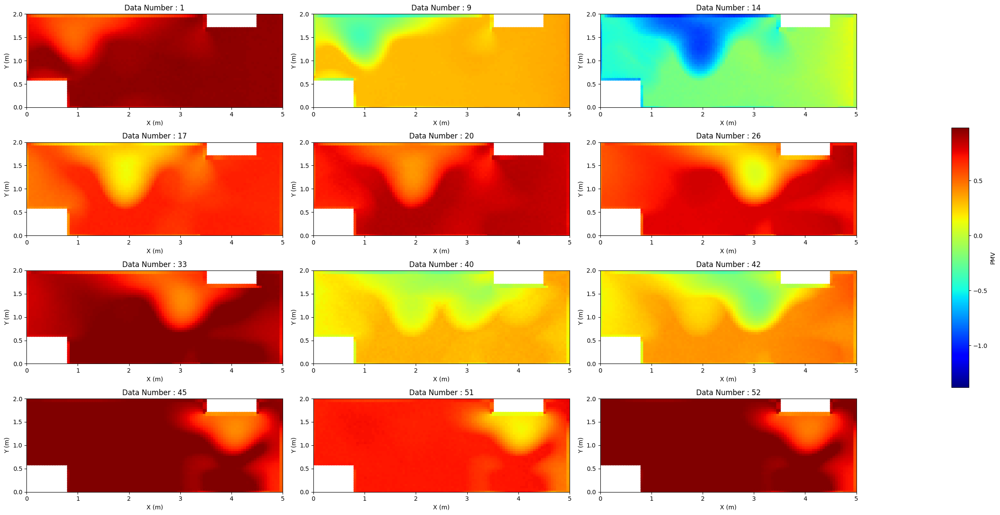

In [ ]:
plot(y_test_result,df_base,Name_test,0.975)

### Results Analysis

Results Functions

In [ ]:
def result_tab(y, y_result, name):
  # Return a tab with the mean,min and max relative error
  Error = Erreur_relative(y, y_result)
  df = pd.DataFrame(Error)

  df['Mean Relative Error'] = df.mean(axis=1)
  df['Max Relative Error'] = df.max(axis=1)
  df['Min Relative Error'] = df.min(axis=1)
  df['Data Number'] = name
  df_output = df[['Data Number', 'Mean Relative Error', 'Max Relative Error', 'Min Relative Error']]
  return df_output.style.hide()


In [ ]:
def boxplot(y, y_result, name, ymax):
    Error = Erreur_relative(y, y_result)
    Error = np.transpose(Error)
    df = pd.DataFrame(Error)

    fig, ax = plt.subplots(figsize=(20, 10))

    df.plot(kind='box', whis=[0, 100], ax=ax)

    # Définir la limite de l'axe y
    ax.set_ylim(0, ymax)
    ax.set_xticklabels(name)
    ax.set_xlabel('Data Number')
    ax.set_ylabel('Error (in percent)')

    plt.show()

In [ ]:
def plot_3D_result(y1,y2,title):

  df1 = df_base.copy()
  df1['PMV'] = y1
  df2 = df_base.copy()
  df2['PMV'] = y2

  interactiv_3D_plot(df1, df2,title)

Result on Training Dataset

In [ ]:
result_tab(y_train, y_train_result, Name_train)


Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
0,1.944727,18.765280,0.000016
2,1.992426,5.366632,0.000263
3,1.541279,9.982473,0.001512
5,2.202213,23.491580,0.000117
6,0.758797,3.680600,0.000007
7,1.444504,9.563175,0.000034
8,1.442738,5.162371,0.000017
10,0.552761,3.116146,0.000019
11,1.428417,3.422175,0.000147
12,0.478705,3.668849,0.000008


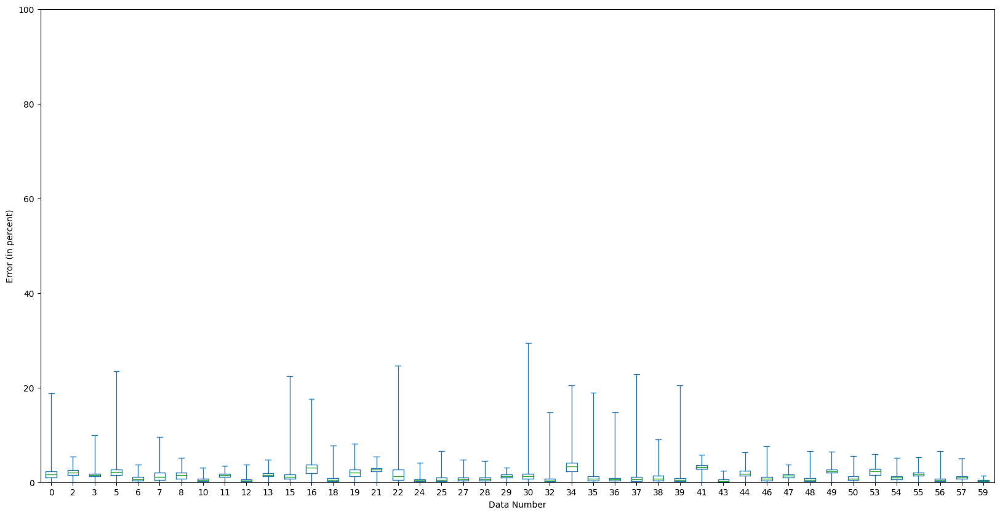

In [ ]:
boxplot(y_train, y_train_result, Name_train,100)

Result on Testing Dataset

In [ ]:
result_tab(y_test, y_test_result, Name_test)

Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
1,8.139490,53.764786,0.000769
9,45.553799,63.609825,38.764022
14,13.791781,56.671329,0.001049
17,17.692813,44.134488,4.571568
20,3.439430,24.077738,0.000005
26,12.865245,82.570525,0.000236
33,1.204221,19.766154,0.000001
40,6.222906,57.641637,0.000053
42,6.863333,26.723788,0.000176
45,7.227992,15.973080,2.192717


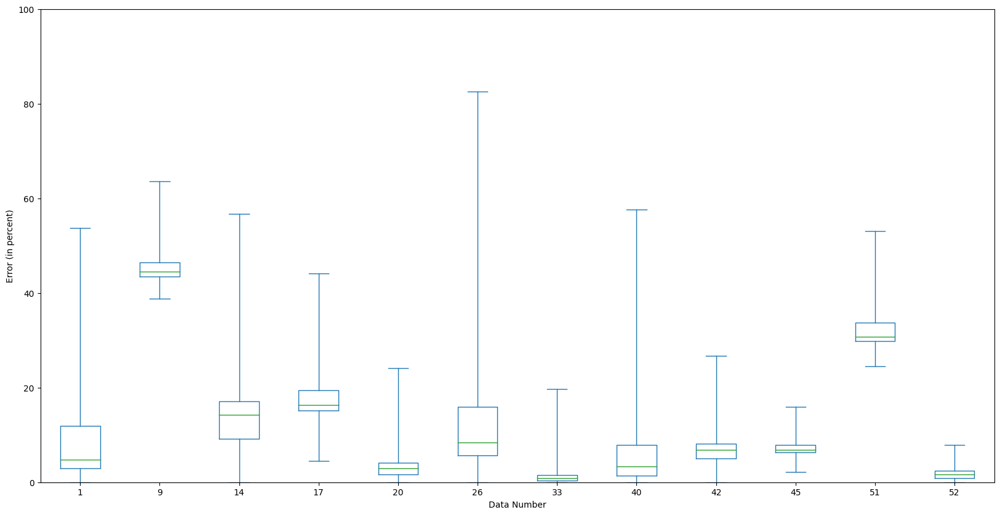

In [ ]:
boxplot(y_test, y_test_result, Name_test,100)

In [ ]:
plot_3D_result(y_test[0], y_test_result[0], ['Data','Result'])

GridspecLayout(children=(FloatSlider(value=0.025, description='X:', layout=Layout(grid_area='widget001'), max=…

# Neural Network : Reduction

## Data Reduction

In [ ]:
def dimension_reduction(df):

  new_df = pd.DataFrame(columns=['X[m]', 'Y[m]', 'Z[m]', 'PMV'])
  # Définir la taille de chaque petit cube
  cube_size = 0.1  # Vous pouvez ajuster cette valeur selon vos besoins
  # Boucle à travers chaque petit cube
  for x in np.round([0.025 + i*cube_size for i in range(int((4.975-0.025)/cube_size) + 1)], 3):
      for y in np.round([0.025 + i*cube_size for i in range(int((1.975-0.025)/cube_size) + 1)], 3):
          for z in np.round([0.025 + i*cube_size for i in range(int((1.175-0.025)/cube_size) + 1)], 3):
              # Sélectionnez les données à l'intérieur du petit cube
              cube_data = df[(df['X[m]'] >= x) & (df['X[m]'] < x + cube_size) &
                            (df['Y[m]'] >= y) & (df['Y[m]'] < y + cube_size) &
                            (df['Z[m]'] >= z) & (df['Z[m]'] < z + cube_size)]
              # Calculez la moyenne de PMV dans ce petit cube
              pmv_mean = cube_data['PMV'].mean()
              # Ajoutez les valeurs moyennes du petit cube au nouveau DataFrame
              new_df = pd.concat([new_df, pd.DataFrame({'X[m]': [x + 0.025],
                                                          'Y[m]': [y + 0.025],
                                                          'Z[m]': [z + 0.025],
                                                          'PMV': [pmv_mean]})], ignore_index=True)
  new_df = new_df.dropna(subset=['PMV'])
  new_df.reset_index(drop=True, inplace=True)

  return new_df


if Reduction :
  dfs_rd = []

  for i in range(60):
      filename = f"data_reduced{i}.csv"
      df = dfs[i]
      dfs_rd = dimension_reduction(df)
      dfs_rd.to_csv('Research_Project/Summer/Dataset_rd' + filename, index=False)
      dfs_rd.append(dfs_rd)



y_train_rd = np.array([dfs_rd[i].loc[:, 'PMV'] for i in index_train])
y_test_rd = np.array([dfs_rd[i].loc[:, 'PMV'] for i in index_test])
y_val_rd = np.array([dfs_rd[i].loc[:, 'PMV'] for i in index_val])

## Training

In [ ]:
if Training:

  model_rd, history_rd = train_model(X_train, y_train_rd,X_val,y_val_rd,10479)
  model_rd.save('Research_Project/Summer/Model/model_summer_rd.h5')
  with open('Research_Project/Summer/History/history_summer_rd.pkl', 'wb') as f:
    pickle.dump(history_rd, f)

In [ ]:
if not Training:

  model_rd = load_model('Research_Project/Summer/Model/model_summer_rd.h5')
  with open('Research_Project/Summer/History/history_summer_rd.pkl', 'rb') as f:
    history_rd = pickle.load(f)

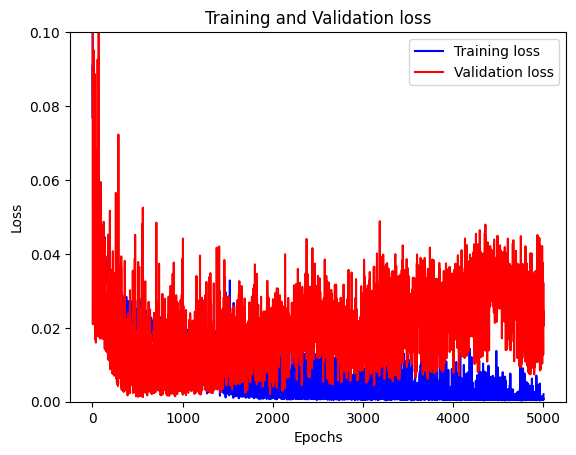

In [ ]:
training_loss(history_rd)

## Results Analysis

### Test on Training Dataset

In [ ]:
y_train_result_rd = model_rd.predict(X_train)

2/2 [==============================] - 0s 4ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



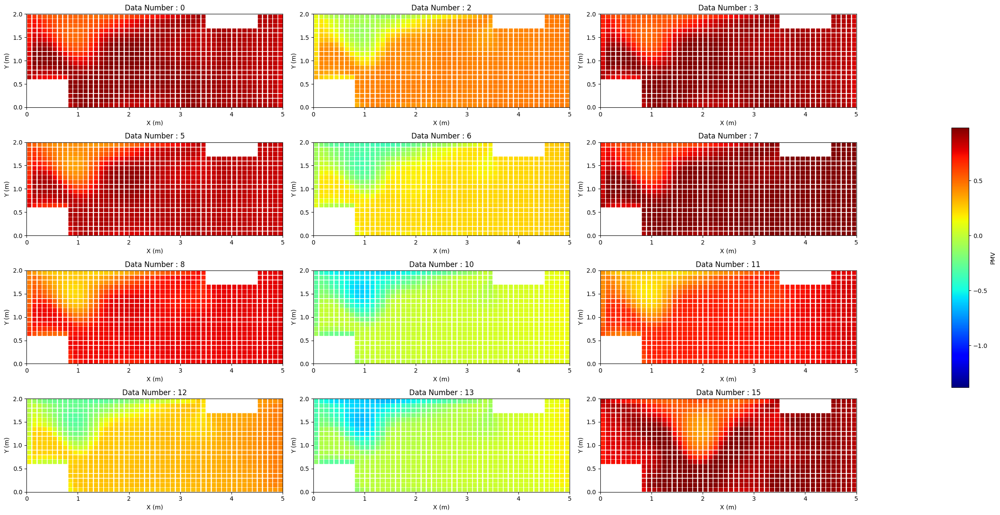

In [ ]:
plot(y_train_result_rd[0:12],df_base_rd,Name_train,0.95)

### Test on Testing Dataset

In [ ]:
y_test_result_rd = model_rd.predict(X_test)

1/1 [==============================] - 0s 16ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



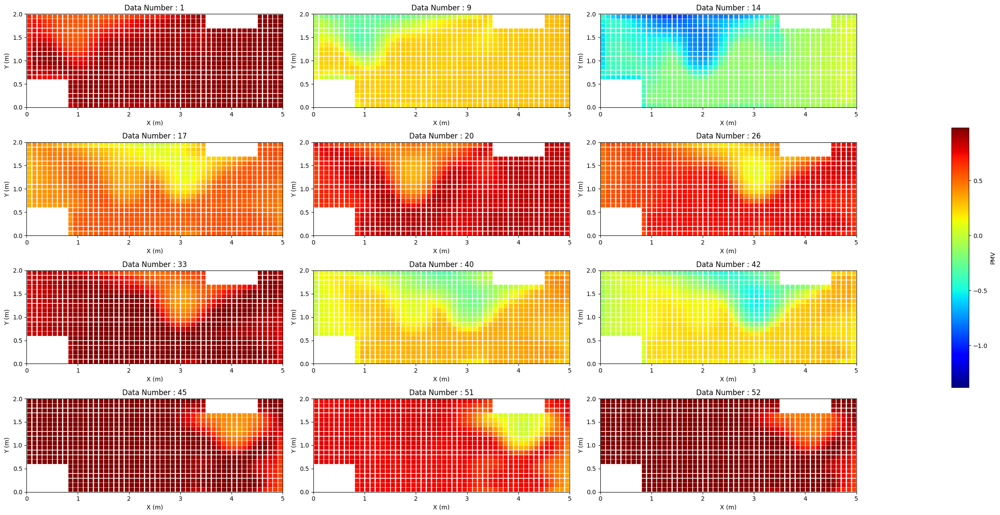

In [ ]:
plot(y_test_result_rd,df_base_rd,Name_test,0.95)

### Results Analysis

Result on Training Dataset

In [ ]:
result_tab(y_train_rd, y_train_result_rd, Name_train)


Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
0,3.402970,6.587847,0.001325
2,3.989605,10.068709,0.027620
3,5.094017,12.458410,0.015340
5,2.645071,12.867183,0.000102
6,1.225768,8.043085,0.000053
7,4.417559,13.502745,0.003032
8,1.399504,7.862750,0.000033
10,0.506339,3.759607,0.000044
11,6.565988,9.431829,3.048341
12,0.879604,4.453177,0.000039


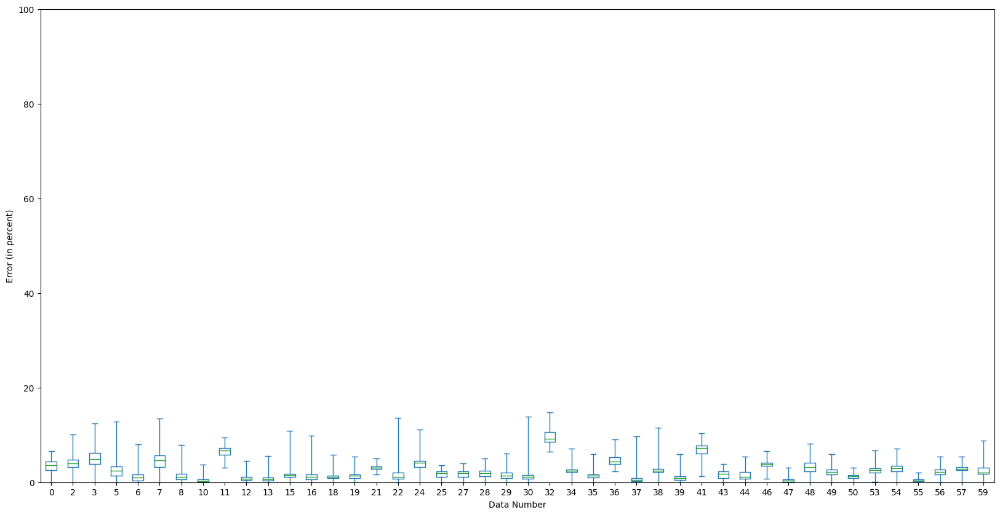

In [ ]:
boxplot(y_train_rd, y_train_result_rd, Name_train,100)

Result on Testing Dataset

In [ ]:
result_tab(y_test_rd, y_test_result_rd, Name_test)

Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
1,9.048442,47.262820,0.000184
9,53.700125,62.970830,49.924798
14,16.913189,59.110214,0.000904
17,8.137317,70.541140,0.000452
20,2.732203,11.280427,0.001036
26,15.449526,82.564843,0.003017
33,0.779731,6.941705,0.000089
40,3.881780,31.648978,0.000405
42,24.147201,33.441243,19.978105
45,9.490665,15.785781,4.333814


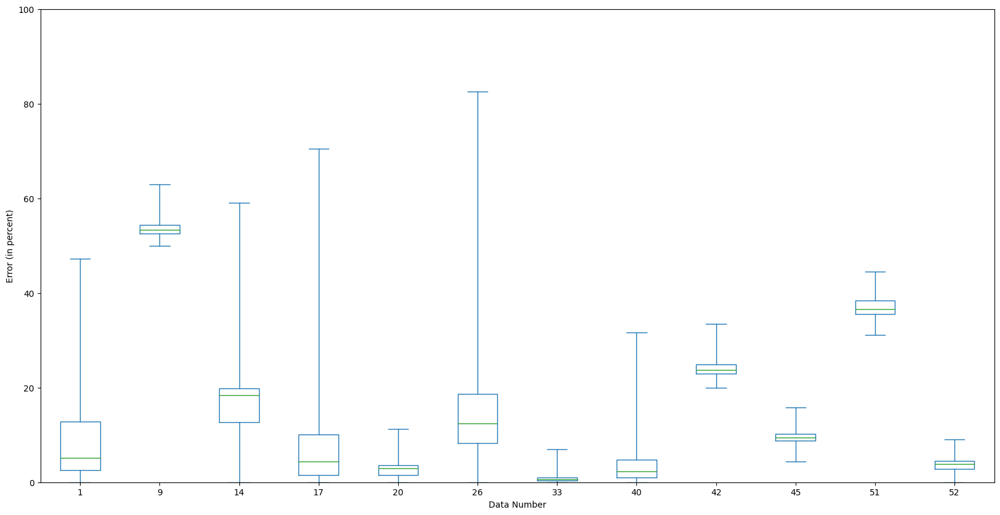

In [ ]:
boxplot(y_test_rd, y_test_result_rd, Name_test,100)

# Neural Network : Normalization

## For Input Data

Normalization

$U_{\text{norm}} = \frac{U_{\text{in}} - \text{min}(U_{\text{in}})}{\text{max}(U_{\text{in}}) - \text{min}(U_{\text{in}})}$


In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler_N = MinMaxScaler()
scaler_N.fit(X_train)

MinMaxScaler()

In [ ]:
X_train_N = scaler_N.transform(X_train)
X_val_N = scaler_N.transform(X_val)
X_test_N = scaler_N.transform(X_test)

## Training

In [ ]:
if Training:

  model_N, history_N = train_model(X_train_N, y_train,X_val_N,y_val,83184)
  model_N.save('Research_Project/Summer/Model/model_summer_N.h5')
  with open('Research_Project/Summer/History/history_summer_N.pkl', 'wb') as f:
    pickle.dump(history_N, f)

In [ ]:
if not Training:

  model_N = load_model('Research_Project/Summer/Model/model_summer_N.h5')
  with open('Research_Project/Summer/History/history_summer_N.pkl', 'rb') as f:
    history_N = pickle.load(f)

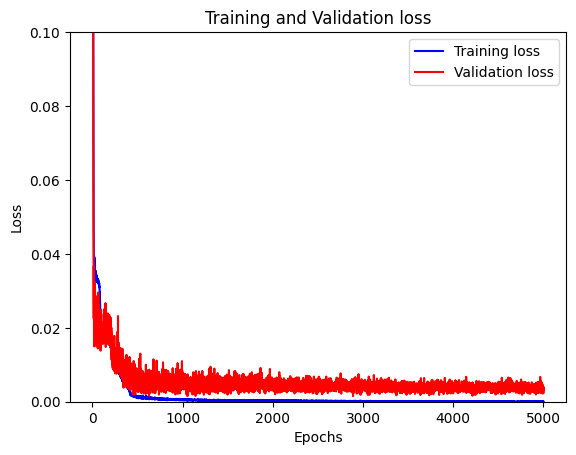

In [ ]:
training_loss(history_N)

## Results Analysis

### Test on Training Dataset

In [ ]:
y_train_result_N = model_N.predict(X_train_N)

2/2 [==============================] - 0s 4ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



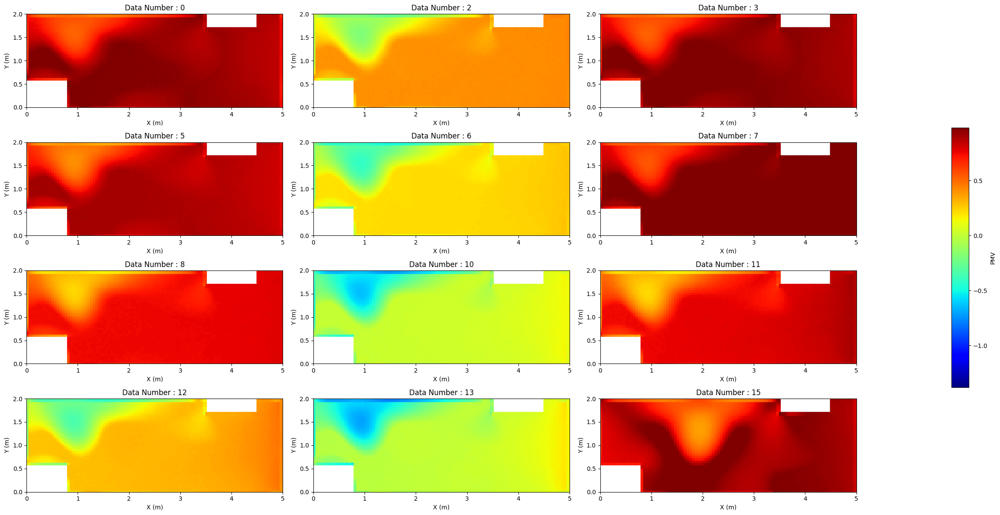

In [ ]:
plot(y_train_result_N[0:12],df_base,Name_train,0.975)

### Test on Testing Dataset

In [ ]:
y_test_result_N = model_N.predict(X_test_N)

1/1 [==============================] - 0s 17ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



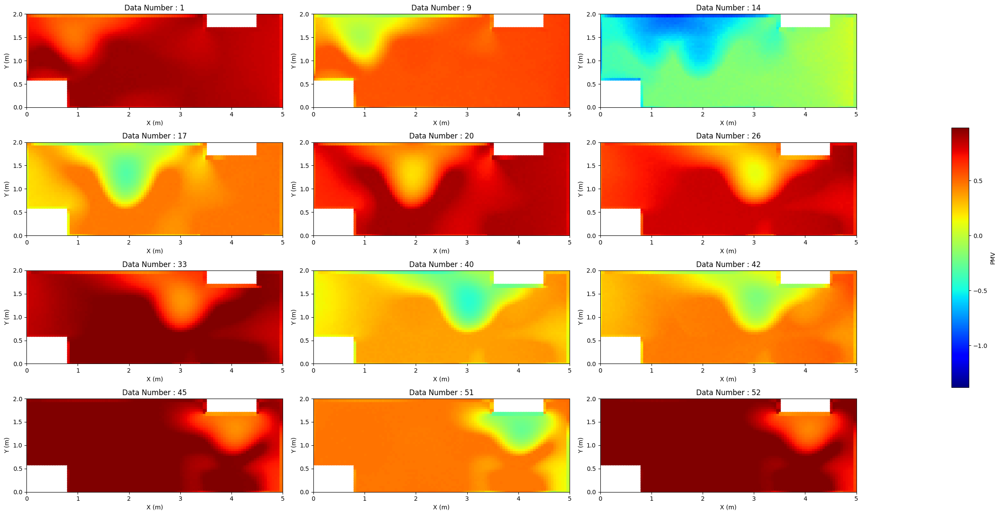

In [ ]:
plot(y_test_result_N,df_base,Name_test,0.975)

### Results Analysis

Result on Training Dataset

In [ ]:
result_tab(y_train, y_train_result_N, Name_train)


Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
0,0.751185,9.641106,0.000007
2,0.929528,5.554641,0.000056
3,0.483317,13.606905,0.000005
5,0.956695,18.089476,0.000012
6,0.535096,6.003818,0.000020
7,1.257500,8.193810,0.000125
8,1.175136,5.300663,0.000126
10,0.281293,3.220674,0.000000
11,1.394779,6.688496,0.000468
12,0.657738,4.586905,0.000013


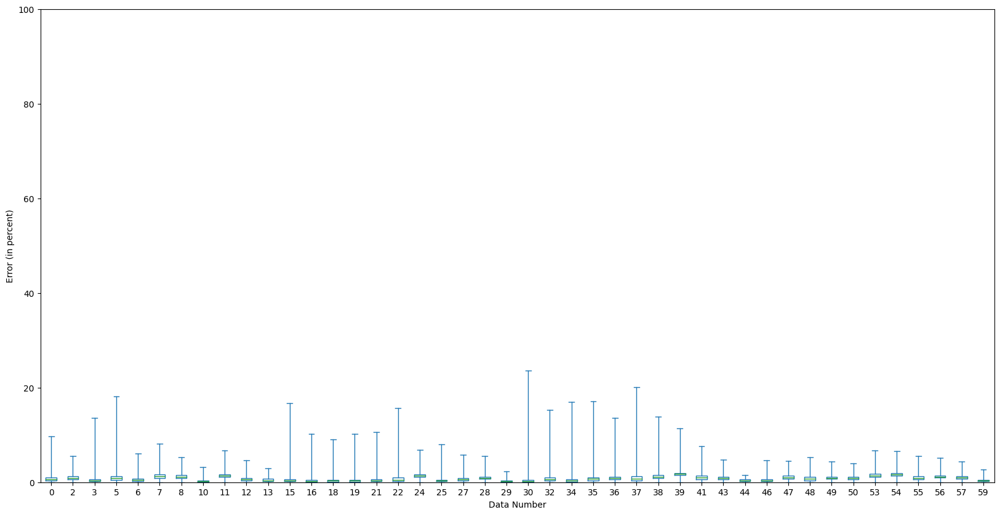

In [ ]:
boxplot(y_train, y_train_result_N, Name_train,100)

Result on Testing Dataset

In [ ]:
result_tab(y_test, y_test_result_N, Name_test)

Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
1,0.973443,16.529715,0.000002
9,11.691819,24.851559,5.839182
14,13.625349,45.365437,0.000470
17,9.674165,18.050551,0.127252
20,0.713181,16.370085,0.000005
26,10.615810,78.781074,0.000131
33,1.366374,16.523445,0.000034
40,3.817003,16.510130,0.000200
42,2.914599,16.950474,0.000015
45,6.152362,10.085016,1.928520


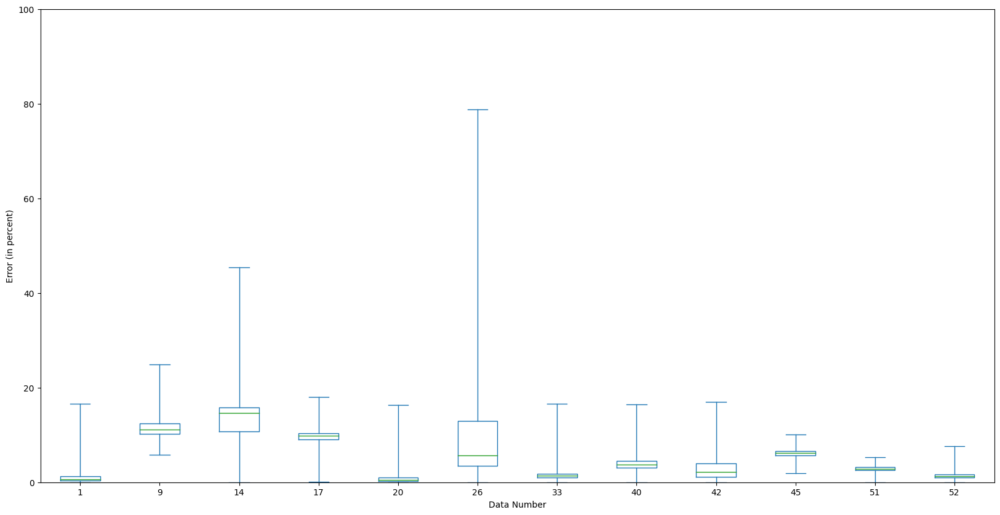

In [ ]:
boxplot(y_test, y_test_result_N, Name_test,100)

In [ ]:
plot_3D_result(y_test[0], y_test_result_N[0], ['Data','Result'])

GridspecLayout(children=(FloatSlider(value=0.025, description='X:', layout=Layout(grid_area='widget001'), max=…

# Neural Network : Standardization

## For Input Data

Standardization

$ U_{stand} = \frac{{U_{in} - \mu}}{{\sigma}} $


*   $ \mu$ is the mean of the inlet velocity
*   $ \sigma$ is the variance of the inlet velocity


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler_S = StandardScaler()
scaler_S.fit(X_train)

StandardScaler()

In [ ]:
X_train_S = scaler_S.transform(X_train)
X_val_S =  scaler_S.transform(X_val)
X_test_S =  scaler_S.transform(X_test)

## Training

In [ ]:
if Training:

  model_S, history_S = train_model(X_train_S, y_train,X_val_S,y_val,83184)
  model_S.save('Research_Project/Summer/Model/model_summer_S.h5')
  with open('Research_Project/Summer/History/history_summer_S.pkl', 'wb') as f:
    pickle.dump(history_S, f)

In [ ]:
if not Training:

  model_S = load_model('Research_Project/Summer/Model/model_summer_S.h5')
  with open('Research_Project/Summer/History/history_summer_S.pkl', 'rb') as f:
    history_S = pickle.load(f)

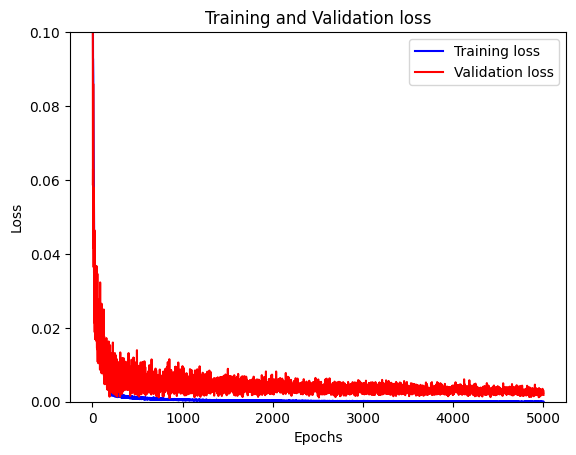

In [ ]:
training_loss(history_S)

## Results Analysis

### Test on Training Dataset

In [ ]:
y_train_result_S = model_S.predict(X_train_S)

2/2 [==============================] - 0s 4ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



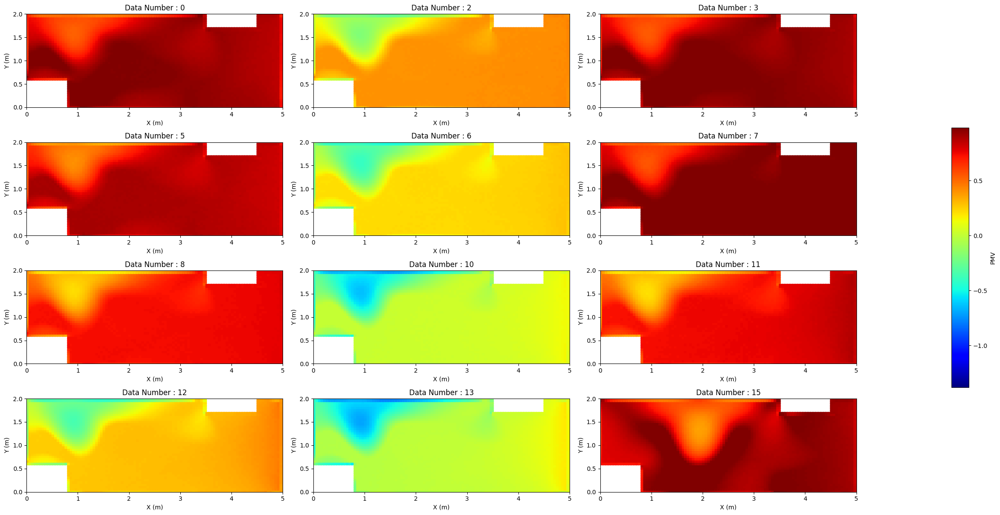

In [ ]:
plot(y_train_result_S[0:12],df_base,Name_train,0.975)

### Test on Testing Dataset

In [ ]:
y_test_result_S = model_S.predict(X_test_S)

1/1 [==============================] - 0s 16ms/step


<ipython-input-426-fe5f00ff8e69>:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



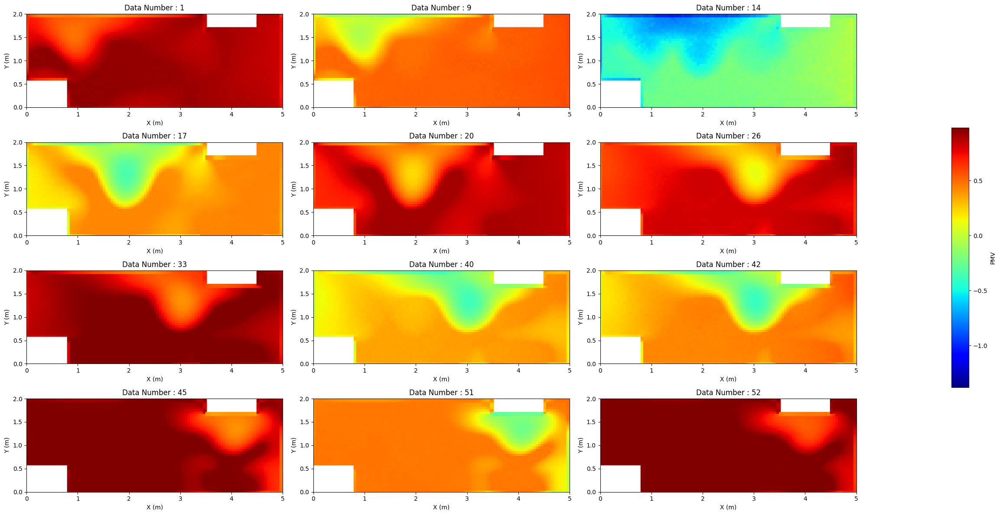

In [ ]:
plot(y_test_result_S,df_base,Name_test,0.975)

### Results Analysis

Result on Training Dataset

In [ ]:
result_tab(y_train, y_train_result_S, Name_train)


Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
0,0.489582,9.587452,0.000012
2,1.507180,7.184488,0.001183
3,0.805463,13.504576,0.000038
5,0.620827,16.643761,0.000025
6,0.307003,4.787938,0.000003
7,0.842345,11.697907,0.000043
8,0.673798,6.946470,0.000009
10,0.274587,3.430975,0.000000
11,0.730532,4.600384,0.000001
12,1.017284,3.279407,0.000179


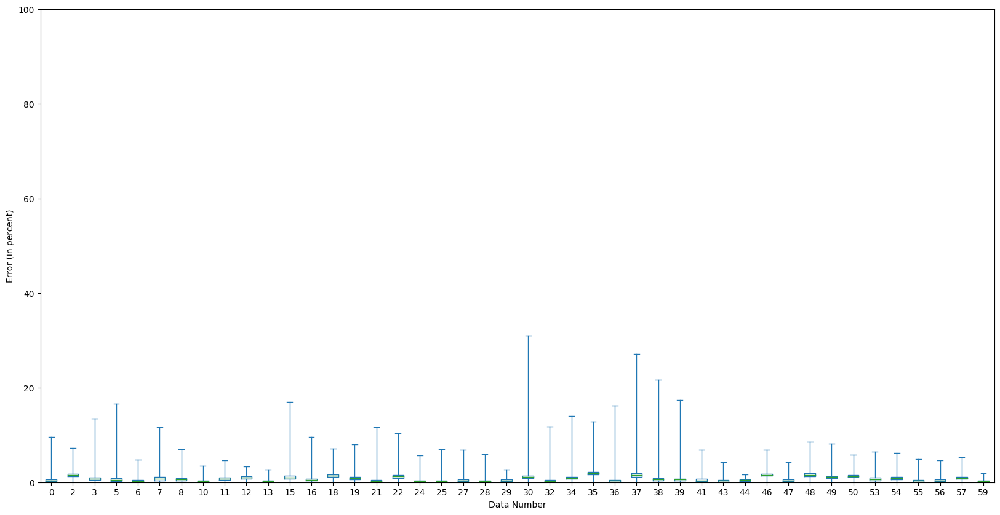

In [ ]:
boxplot(y_train, y_train_result_S, Name_train,100)

Result on Testing Dataset

In [ ]:
result_tab(y_test, y_test_result_S, Name_test)

Data Number,Mean Relative Error,Max Relative Error,Min Relative Error
1,3.026753,11.573944,0.016951
9,16.889560,23.321912,11.255471
14,11.434768,48.311466,0.000576
17,14.228789,21.396682,0.075694
20,0.437385,18.049007,0.000000
26,11.013295,79.197610,0.000243
33,2.393399,15.003336,0.024436
40,4.160705,17.906966,0.000244
42,4.293493,18.646694,0.000002
45,6.171570,10.893303,0.943423


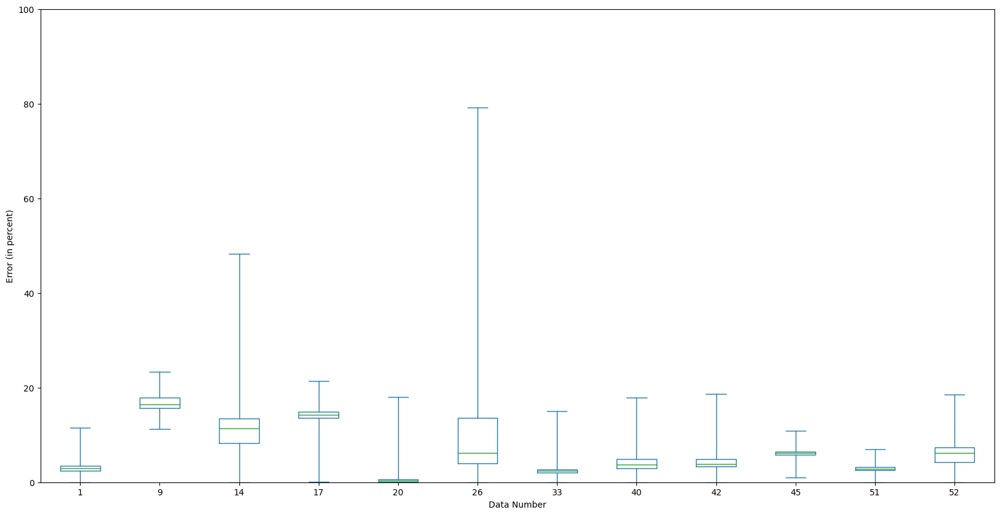

In [ ]:
boxplot(y_test, y_test_result_S, Name_test,100)

In [ ]:
plot_3D_result(y_test[0], y_test_result_S[0], ['Data','Result'])

GridspecLayout(children=(FloatSlider(value=0.025, description='X:', layout=Layout(grid_area='widget001'), max=…

# Comparison


## Functions

In [ ]:
from matplotlib.patches import PathPatch
def boxplot_comparison(ys, y_results, names,ymax,colors,legend_labels):
  result_df = pd.DataFrame()
  output_df = pd.DataFrame()
  for i, y_result in enumerate(y_results):
    Error = Erreur_relative(ys[i], y_result)
    Error = np.transpose(Error)
    df = pd.DataFrame(Error)
    result_df = pd.concat([result_df, df], axis=1)

  for i in range(len(y_results[0])):
    output_df = pd.concat([output_df, result_df[i]], axis=1)
  output_df=output_df.astype(float)
  output_df.columns = range(output_df.shape[1])

  ax = output_df.plot(kind='box',whis=[0, 100] ,patch_artist = True,figsize = (20,10))

  children = ax.get_children()
  compteur = 0
  box = len(ys)
  for i, child in enumerate(children):
    if isinstance(child, PathPatch) :
      for j in range(box):
        if compteur % box == j:
          child.set_color(colors[j])
      compteur+=1


  # Définir la limite de l'axe y
  ax.set_ylim(0, ymax)

  positions = np.linspace((box+1)/2, box*len(names)+1-(box+1)/2, len(names))
  ax.set_xticks(positions)
  ax.set_xticklabels(names)

  ax.set_xlabel('Data Number')
  ax.set_ylabel('Error (in percent)')

  custom_legend = [plt.Line2D([0], [0], color=color, lw=6) for color in colors]
  ax.legend(custom_legend, legend_labels)

  plt.show()

In [ ]:
import pandas as pd

def tab_comparison(y, y_results, names,column_names):
  # Initialize an empty DataFrame to store the results
  result_df = pd.DataFrame()
  result_df['Data Number'] = names

  for i, y_result in enumerate(y_results):
      # Calculate relative errors
      Error = Erreur_relative(y[i], y_result)
      df = pd.DataFrame(Error)

      # Calculate mean, max, and min relative errors
      df[column_names[i]] = df.mean(axis=1)

      # Concatenate the current results with the overall results
      result_df = pd.concat([result_df, df[column_names[i]]], axis=1)

  means = result_df.mean(axis=0)

  # Add a new row with the means to the DataFrame
  result_df.loc[len(result_df)] = ['Mean'] + list(means[1:])

  return result_df.style.hide()

## On Training Data

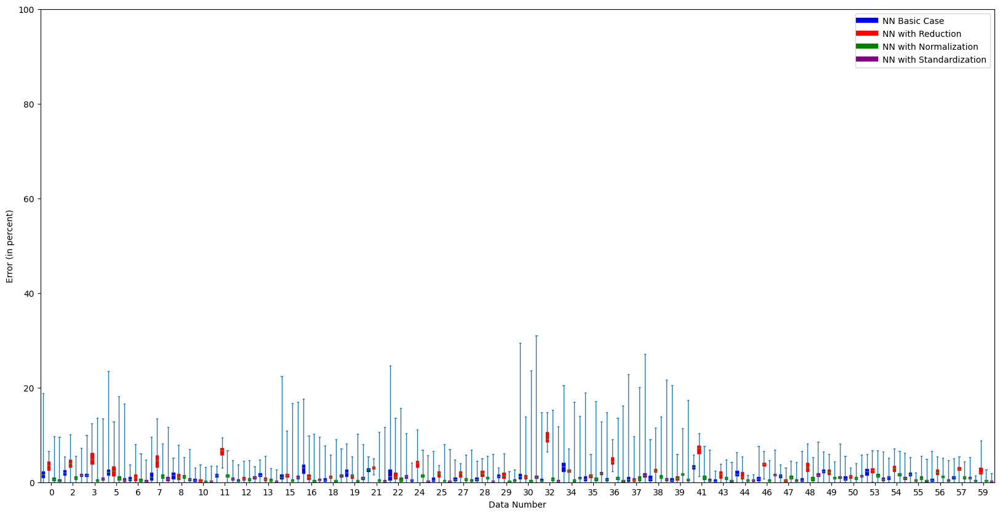

In [ ]:
boxplot_comparison([y_train,y_train_rd, y_train, y_train], [y_train_result,y_train_result_rd, y_train_result_N, y_train_result_S], Name_train,100,["blue","red",'green', "purple"], ['NN Basic Case','NN with Reduction',"NN with Normalization", 'NN with Standardization'])

In [ ]:
tab_comparison([y_train,y_train_rd, y_train, y_train], [y_train_result,y_train_result_rd, y_train_result_N, y_train_result_S], Name_train, ['NN Basic Case','NN with Reduction',"NN with Normalization", 'NN with Standardization'])

Data Number,NN Basic Case,NN with Reduction,NN with Normalization,NN with Standardization
0,1.944727,3.402970,0.751185,0.489582
2,1.992426,3.989605,0.929528,1.507180
3,1.541279,5.094017,0.483317,0.805463
5,2.202213,2.645071,0.956695,0.620827
6,0.758797,1.225768,0.535096,0.307003
7,1.444504,4.417559,1.257500,0.842345
8,1.442738,1.399504,1.175136,0.673798
10,0.552761,0.506339,0.281293,0.274587
11,1.428417,6.565988,1.394779,0.730532
12,0.478705,0.879604,0.657738,1.017284


## On Testing Data

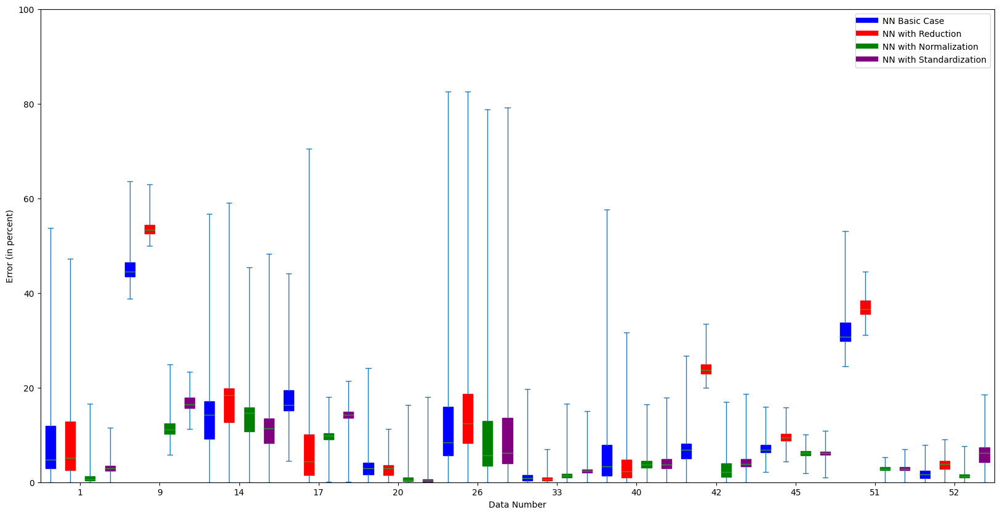

In [ ]:
boxplot_comparison([y_test,y_test_rd,y_test,y_test], [y_test_result,y_test_result_rd,y_test_result_N,y_test_result_S], Name_test, 100,["blue","red",'green', "purple"], ['NN Basic Case','NN with Reduction',"NN with Normalization", 'NN with Standardization'])

In [ ]:
tab_comparison([y_test,y_test_rd,y_test,y_test], [y_test_result,y_test_result_rd,y_test_result_N,y_test_result_S], Name_test, ['NN Basic Case','NN with Reduction',"NN with Normalization", 'NN with Standardization'])

Data Number,NN Basic Case,NN with Reduction,NN with Normalization,NN with Standardization
1,8.139490,9.048442,0.973443,3.026753
9,45.553799,53.700125,11.691819,16.889560
14,13.791781,16.913189,13.625349,11.434768
17,17.692813,8.137317,9.674165,14.228789
20,3.439430,2.732203,0.713181,0.437385
26,12.865245,15.449526,10.615810,11.013295
33,1.204221,0.779731,1.366374,2.393399
40,6.222906,3.881780,3.817003,4.160705
42,6.863333,24.147201,2.914599,4.293493
45,7.227992,9.490665,6.152362,6.171570


# Feature importance

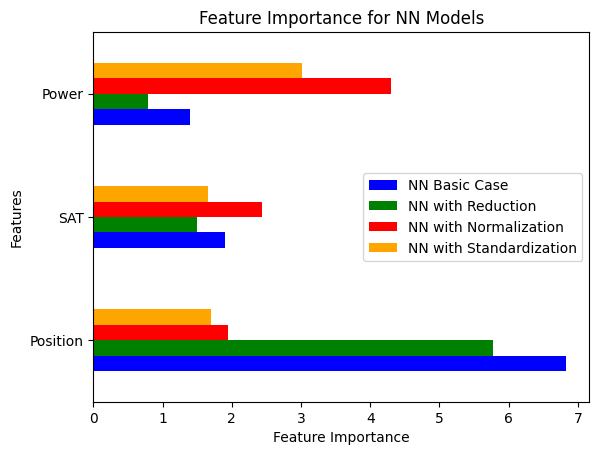

In [ ]:
models = [model, model_rd, model_N, model_S]  # Remplacez model1, model2, etc. par vos modèles
models_name = ['NN Basic Case','NN with Reduction',"NN with Normalization", 'NN with Standardization']
colors = ['blue', 'green', 'red', 'orange']

# Initialisation du DataFrame pour stocker l'importance des caractéristiques
feature_importance_df = pd.DataFrame(index=['Position', 'SAT', 'Power'])

# Parcours des modèles
for i, model in enumerate(models):
    # Obtention des poids du modèle
    weights = model.get_weights()

    # Calcul de l'importance des caractéristiques
    feature_importance = np.sum(np.abs(weights[0]), axis=1)

    # Ajout de l'importance des caractéristiques au DataFrame
    feature_importance_df[models_name[i]] = feature_importance

# Tracé du graphique
feature_importance_df.plot(kind='barh', color=colors)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance for NN Models')
plt.show()
